In [1]:
!pip install opencv-python numpy matplotlib


[notice] A new release of pip is available: 24.0 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def display_images(images, titles, figsize=(15, 5)):
    """Helper function to display multiple images side by side"""
    fig, axes = plt.subplots(1, len(images), figsize=figsize)
    
    for i, (img, title) in enumerate(zip(images, titles)):
        if len(images) == 1:
            ax = axes
        else:
            ax = axes[i]
        ax.imshow(img, cmap='gray' if len(img.shape) == 2 else None)
        ax.set_title(title)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

def denoise_image(image):
    """Apply denoising using Non-local Means Denoising"""
    return cv2.fastNlMeansDenoising(image) if len(image.shape) == 2 else cv2.fastNlMeansDenoisingColored(image)

def apply_morphology(image, operation='erosion', kernel_size=5):
    """Apply morphological operations (erosion or dilation)"""
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    if operation == 'erosion':
        return cv2.erode(image, kernel, iterations=1)
    else:  # dilation
        return cv2.dilate(image, kernel, iterations=1)

def apply_threshold(image, method='binary'):
    """Apply different thresholding methods"""
    if len(image.shape) > 2:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    if method == 'binary':
        _, thresh = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
    elif method == 'adaptive':
        thresh = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                     cv2.THRESH_BINARY, 11, 2)
    elif method == 'otsu':
        _, thresh = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return thresh

def detect_edges(image, method='canny'):
    """Apply edge detection"""
    if len(image.shape) > 2:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    if method == 'canny':
        return cv2.Canny(image, 100, 200)
    elif method == 'sobel':
        sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=5)
        sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=5)
        return cv2.magnitude(sobelx, sobely)

def equalize_histogram(image):
    """Apply histogram equalization"""
    if len(image.shape) == 2:
        return cv2.equalizeHist(image)
    else:
        # Convert to LAB color space
        lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab)
        # Apply histogram equalization to L channel
        l_eq = cv2.equalizeHist(l)
        # Merge channels and convert back to BGR
        lab_eq = cv2.merge([l_eq, a, b])
        return cv2.cvtColor(lab_eq, cv2.COLOR_LAB2BGR)


In [3]:
# Example usage:
image_path = 'low quality documents/2.png'
img = cv2.imread(image_path)
if img is None:
    raise ValueError(f"Could not read image at {image_path}")

# Convert BGR to RGB for display
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Apply different techniques
denoised = cv2.cvtColor(denoise_image(img), cv2.COLOR_BGR2RGB)
eroded = cv2.cvtColor(apply_morphology(img, 'erosion'), cv2.COLOR_BGR2RGB)
dilated = cv2.cvtColor(apply_morphology(img, 'dilation'), cv2.COLOR_BGR2RGB)
threshold = apply_threshold(img, 'otsu')
edges = detect_edges(img)
equalized = cv2.cvtColor(equalize_histogram(img), cv2.COLOR_BGR2RGB)

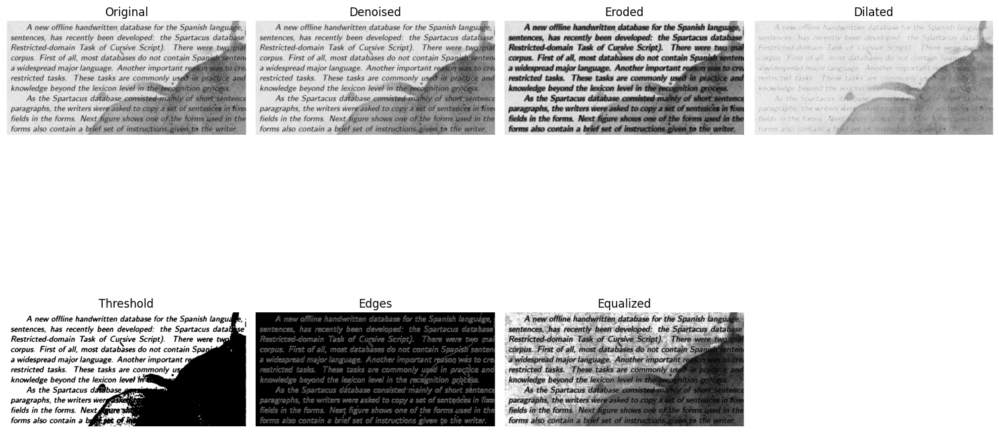

In [4]:
# Create a list of titles and images
titles = ['Original', 'Denoised', 'Eroded', 'Dilated', 'Threshold', 'Edges', 'Equalized']
images = [img_rgb, denoised, eroded, dilated, threshold, edges, equalized]

# Plot the images
plt.figure(figsize=(15, 10))
for i in range(len(images)):
    plt.subplot(2, 4, i + 1)  # Adjust rows and columns as needed
    if len(images[i].shape) == 2:  # Grayscale images
        plt.imshow(images[i], cmap='gray')
    else:
        plt.imshow(images[i])
    plt.title(titles[i])
    plt.axis('off')

plt.tight_layout()
plt.show()

## Trying Techniques 

In [5]:
eroded = cv2.cvtColor(apply_morphology(img, 'erosion', kernel_size=5), cv2.COLOR_BGR2RGB)
dilated = cv2.cvtColor(apply_morphology(img, 'dilation', kernel_size=5), cv2.COLOR_BGR2RGB)

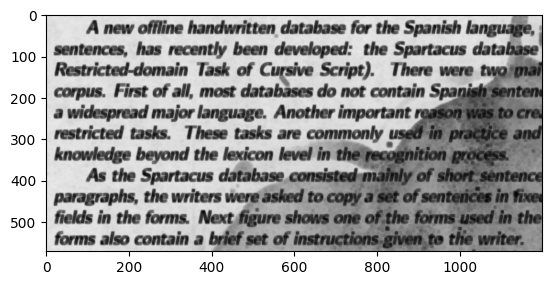

In [6]:
plt.imshow(eroded)
plt.show()

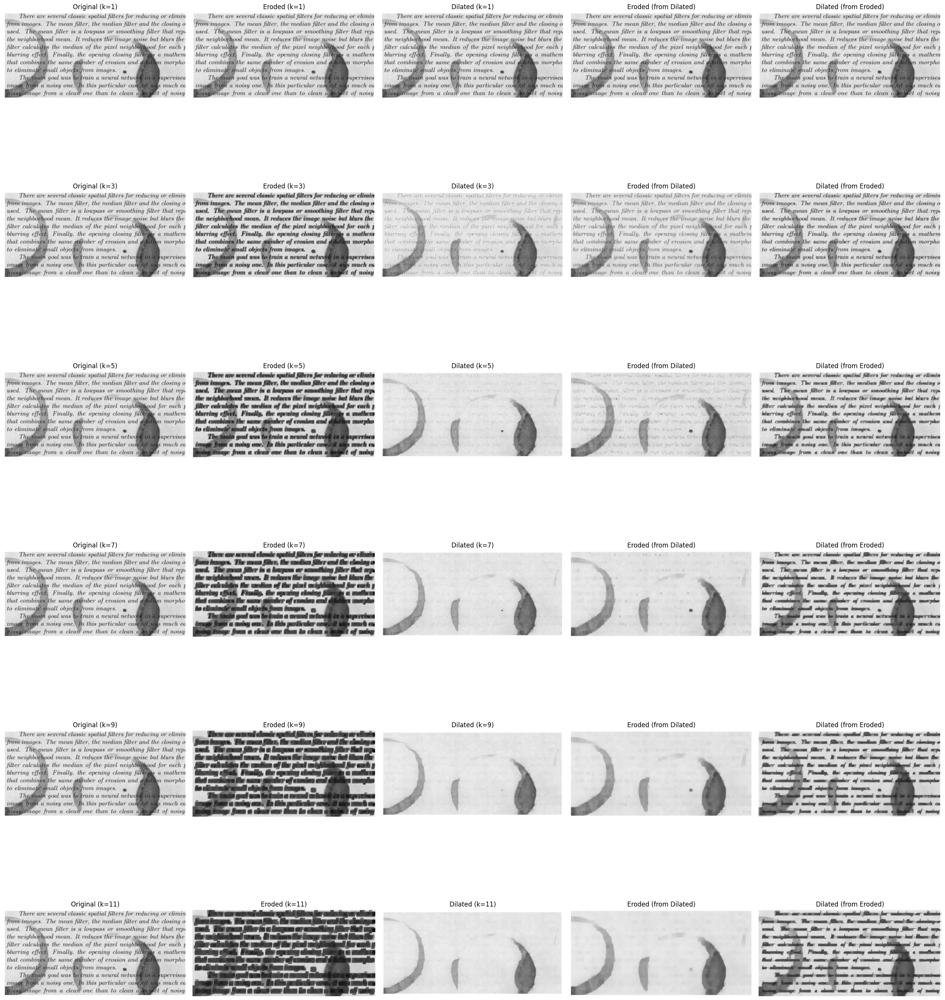

In [7]:
# Load the original image
image_path = 'low quality documents/1.png'
img = cv2.imread(image_path)
if img is None:
    raise ValueError(f"Could not read image at {image_path}")

# Convert BGR to RGB for display
original_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Define the number of kernel sizes to test
kernel_sizes = list(range(1, 12, 2))  # 1, 3, 5, 7, 9, 11

# Initialize the figure with enough rows for all kernel sizes
rows = len(kernel_sizes)
cols = 5  # Number of columns is fixed

plt.figure(figsize=(cols * 5, rows * 5))  # Dynamically adjust figure size

# Iterate over kernel sizes
for i, kernel_size in enumerate(kernel_sizes):
    # Apply morphological operations
    eroded_img = cv2.cvtColor(apply_morphology(img, 'erosion', kernel_size), cv2.COLOR_BGR2RGB)
    dilated_img = cv2.cvtColor(apply_morphology(img, 'dilation', kernel_size), cv2.COLOR_BGR2RGB)
    eroded_after_dilated = cv2.cvtColor(apply_morphology(dilated_img, 'erosion', kernel_size), cv2.COLOR_BGR2RGB)
    dilated_after_eroded = cv2.cvtColor(apply_morphology(eroded_img, 'dilation', kernel_size), cv2.COLOR_BGR2RGB)

    # Plot the images
    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(original_img)
    plt.title(f'Original (k={kernel_size})')
    plt.axis('off')

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(eroded_img)
    plt.title(f'Eroded (k={kernel_size})')
    plt.axis('off')

    plt.subplot(rows, cols, i * cols + 3)
    plt.imshow(dilated_img)
    plt.title(f'Dilated (k={kernel_size})')
    plt.axis('off')

    plt.subplot(rows, cols, i * cols + 4)
    plt.imshow(eroded_after_dilated)
    plt.title(f'Eroded (from Dilated)')
    plt.axis('off')

    plt.subplot(rows, cols, i * cols + 5)
    plt.imshow(dilated_after_eroded)
    plt.title(f'Dilated (from Eroded)')
    plt.axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


We tried to see what is the output of applying Erodding and Dilating with different size kernel.

Firstly I tried to see what is the effect of Erroding and dilating. And in the next cell I will try to see the effect of dilating and after this erroding

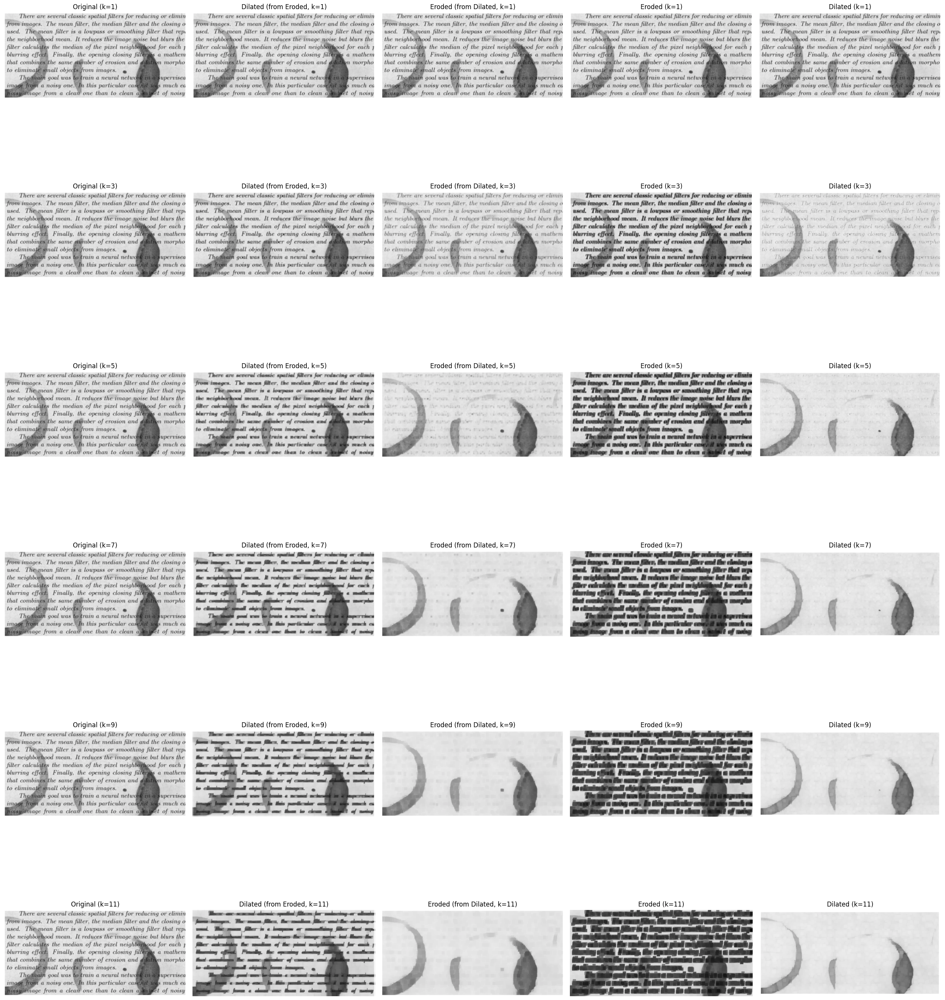

In [8]:
# Load the original image
image_path = 'low quality documents/1.png'
img = cv2.imread(image_path)
if img is None:
    raise ValueError(f"Could not read image at {image_path}")

# Convert BGR to RGB for display
original_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# Define the number of kernel sizes to test
kernel_sizes = list(range(1, 12, 2))  # 1, 3, 5, 7, 9, 11

# Initialize the figure with enough rows for all kernel sizes
rows = len(kernel_sizes)
cols = 5  # Number of columns is fixed

plt.figure(figsize=(cols * 5, rows * 5))  # Dynamically adjust figure size

# Iterate over kernel sizes
for i, kernel_size in enumerate(kernel_sizes):
    # Apply morphological operations
    eroded_img = cv2.cvtColor(apply_morphology(img, 'erosion', kernel_size), cv2.COLOR_BGR2RGB)
    dilated_img = cv2.cvtColor(apply_morphology(img, 'dilation', kernel_size), cv2.COLOR_BGR2RGB)
    dilated_after_eroded = cv2.cvtColor(apply_morphology(eroded_img, 'dilation', kernel_size), cv2.COLOR_BGR2RGB)
    eroded_after_dilated = cv2.cvtColor(apply_morphology(dilated_img, 'erosion', kernel_size), cv2.COLOR_BGR2RGB)

    # Plot the images
    plt.subplot(rows, cols, i * cols + 1)
    plt.imshow(original_img)
    plt.title(f'Original (k={kernel_size})')
    plt.axis('off')

    plt.subplot(rows, cols, i * cols + 2)
    plt.imshow(dilated_after_eroded)
    plt.title(f'Dilated (from Eroded, k={kernel_size})')
    plt.axis('off')

    plt.subplot(rows, cols, i * cols + 3)
    plt.imshow(eroded_after_dilated)
    plt.title(f'Eroded (from Dilated, k={kernel_size})')
    plt.axis('off')

    plt.subplot(rows, cols, i * cols + 4)
    plt.imshow(eroded_img)
    plt.title(f'Eroded (k={kernel_size})')
    plt.axis('off')

    plt.subplot(rows, cols, i * cols + 5)
    plt.imshow(dilated_img)
    plt.title(f'Dilated (k={kernel_size})')
    plt.axis('off')

# Adjust layout and show the plot
plt.tight_layout()
plt.show()


From above cells we can conclude that Erroding helps us to spotline big things on the image. Threfore this can help us to identify them

First method that came in my minde is using the following method:
- Use Dilation with kernel 11/13, on original image.
- Edge detection and make some countours with mask
- Use Errosion with kernel 3-5 in order to spotline text inside of the spots.
- Having mask from step 2, apply denoising and equalization only inside of the spot area.
- Apply a treshold, in order to separe text from the spot

In [9]:
eroded_img = cv2.cvtColor(apply_morphology(img, 'dilation', 11), cv2.COLOR_BGR2RGB)
erroded_after_dilation = cv2.cvtColor(apply_morphology(eroded_img, 'erosion', kernel_size), cv2.COLOR_BGR2RGB)
equalized = equalize_histogram(erroded_after_dilation)
threshold = apply_threshold(equalized, 'otsu')

In [10]:
test = denoise_image(equalized)
test = apply_morphology(test, 'dilation', 5)
test = apply_morphology(test, 'dilation', 15)

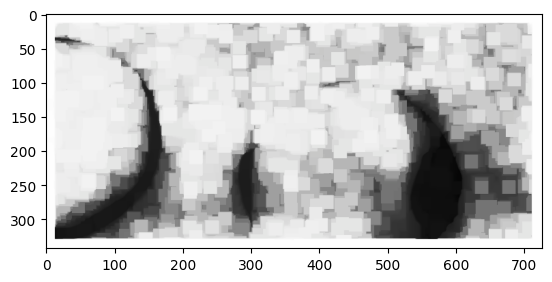

In [11]:
plt.imshow(cv2.cvtColor(test, cv2.COLOR_BGR2RGB))

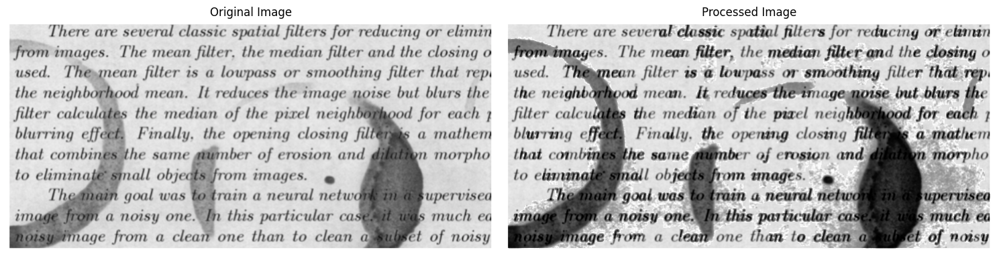

In [12]:
# Create a mask for black regions (value 0 in binary mask)
black_region_mask = (threshold == 0).astype(np.uint8)

# Apply the mask to the original image
# Ensure the original image is in grayscale for histogram equalization
if len(img.shape) > 2:
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
else:
    gray_img = img

# Extract the black region
black_region = cv2.bitwise_and(gray_img, gray_img, mask=black_region_mask)

# Apply denoising and histogram equalization on the black region
#denoised_black_region = denoise_image(black_region)
equalized_black_region = equalize_histogram(black_region)

# Combine the processed black region back into the original image
processed_img = gray_img.copy()
processed_img[black_region_mask == 1] = equalized_black_region[black_region_mask == 1]

# For visualization, convert back to color if the original image is color
if len(img.shape) > 2:
    processed_img = cv2.cvtColor(processed_img, cv2.COLOR_GRAY2BGR)

# Display results
display_images([img, processed_img], ['Original Image', 'Processed Image'])

Somehow it doesn't works. We need to try something differently

In [13]:
import cv2
import numpy as np

# Load the original image
image = img

# Convert to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply denoising
denoised = cv2.fastNlMeansDenoising(gray, h=30)

# Enhance contrast using histogram equalization
equalized = cv2.equalizeHist(denoised)

# Thresholding to detect dark spots
_, thresh = cv2.threshold(equalized, 50, 255, cv2.THRESH_BINARY_INV)

# Erode and dilate to refine the mask
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (11, 11))
eroded = cv2.erode(thresh, kernel, iterations=1)
dilated = cv2.dilate(eroded, kernel, iterations=1)

# Inpainting to remove spots
inpainted = cv2.inpaint(image, dilated, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

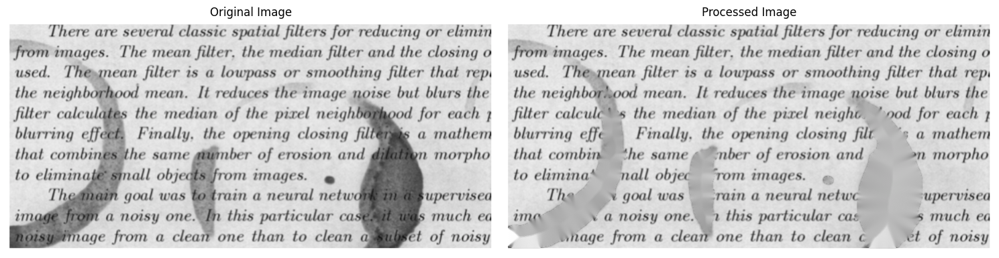

In [14]:
display_images([img, inpainted], ['Original Image', 'Processed Image'])

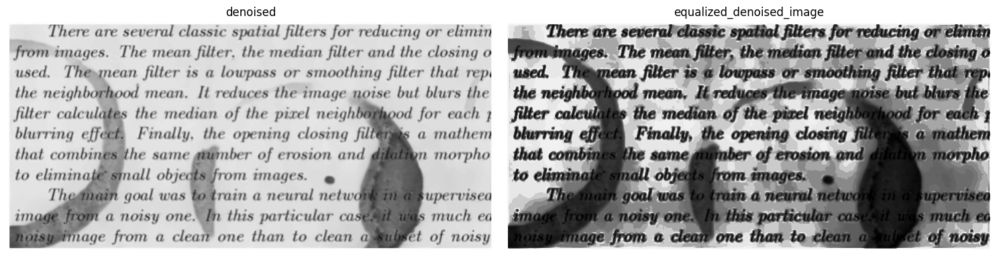

In [15]:
denoised = cv2.cvtColor(denoise_image(img), cv2.COLOR_BGR2RGB)
equalized_denoised_image = cv2.cvtColor(equalize_histogram(denoised), cv2.COLOR_BGR2RGB)
display_images([denoised, equalized_denoised_image], ["denoised", "equalized_denoised_image",])

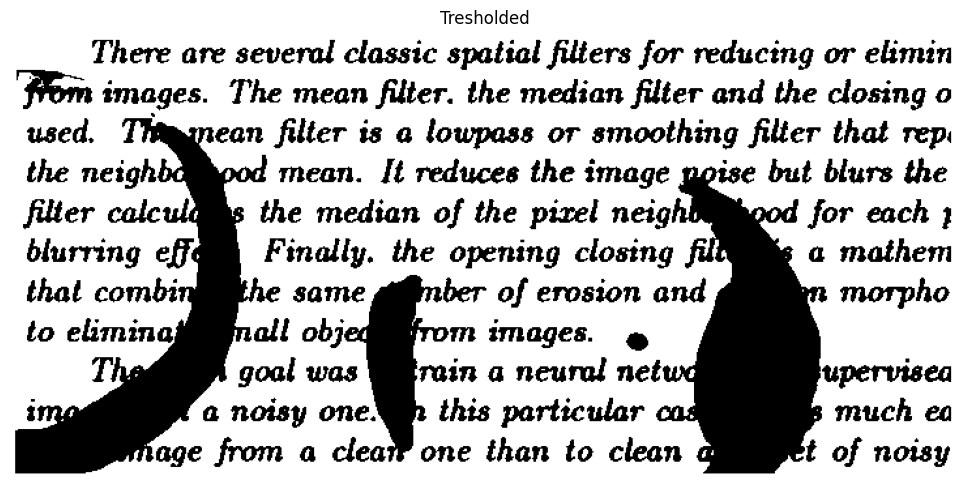

In [16]:
_, thresh = cv2.threshold(equalized_denoised_image, 70, 255, cv2.THRESH_BINARY)

display_images([thresh], ["Tresholded"])


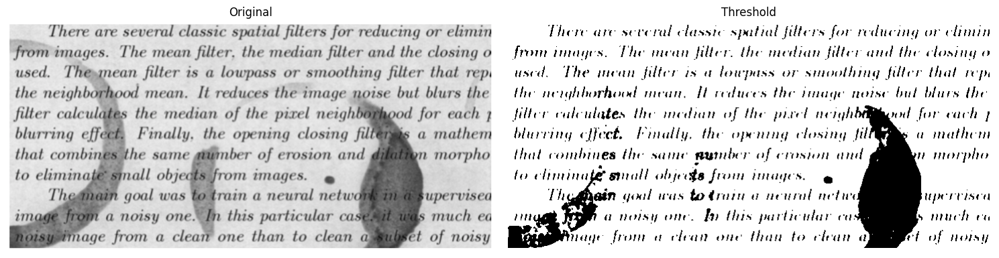

In [17]:
denoised = cv2.cvtColor(denoise_image(img), cv2.COLOR_BGR2RGB)
threshold = apply_threshold(denoised)
display_images([img, threshold], ["Original", "Threshold",])

## Try different Method

In [18]:
import cv2
import numpy as np

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Denoising with Non-Local Means
denoised = cv2.fastNlMeansDenoising(gray, h=20, templateWindowSize=7, searchWindowSize=21)

# Adaptive histogram equalization (CLAHE)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
enhanced = clahe.apply(denoised)

# Text detection using adaptive thresholding
text_mask = cv2.adaptiveThreshold(enhanced, 255, 
                                    cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                    cv2.THRESH_BINARY_INV, 21, 8)

text_mask = apply_morphology(text_mask, 'dilation', 2)
text_mask = apply_morphology(text_mask, 'erosion', 2)


# Final morphological cleanup
text_mask = apply_morphology(text_mask, 'erosion', 1)

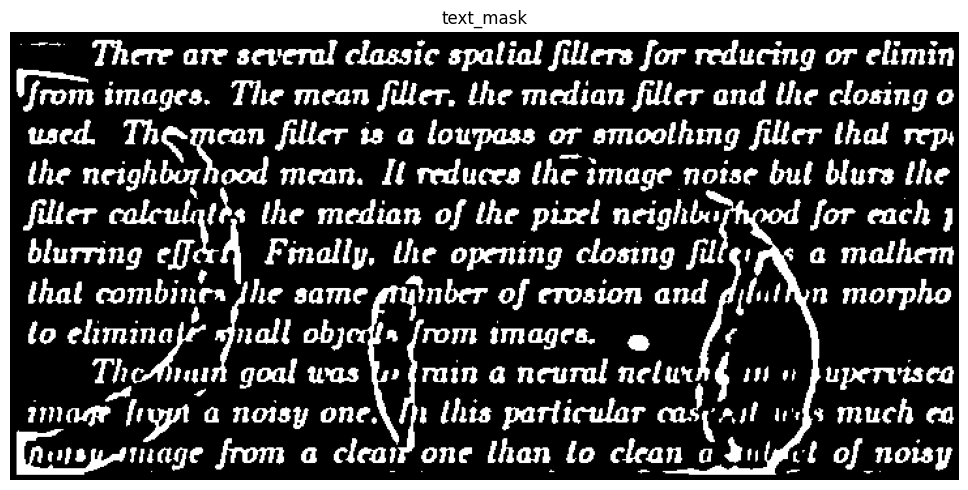

In [19]:
display_images([text_mask], ["text_mask",])

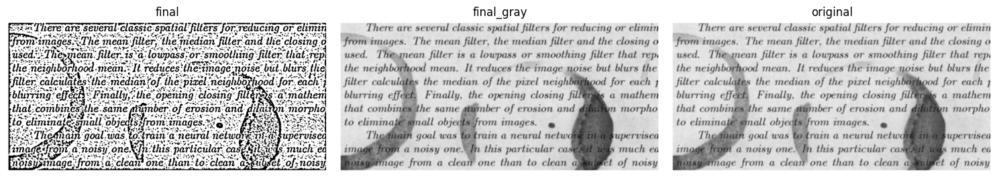

In [20]:
# Clean text mask with morphology
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
text_mask = cv2.morphologyEx(text_mask, cv2.MORPH_CLOSE, kernel, iterations=2)
text_mask = cv2.morphologyEx(text_mask, cv2.MORPH_OPEN, kernel, iterations=1)

# Detect coffee spots (non-text dark regions)
_, spots_mask = cv2.threshold(enhanced, 50, 255, cv2.THRESH_BINARY_INV)


# Remove text regions from spots mask
clean_spots_mask = cv2.subtract(spots_mask, text_mask)

# Refine spots mask with morphology
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
clean_spots_mask = cv2.morphologyEx(clean_spots_mask, cv2.MORPH_CLOSE, kernel, iterations=2)

# Edge-aware inpainting only on spots regions
inpainted = cv2.inpaint(image, clean_spots_mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

# Final text enhancement
final_gray = cv2.cvtColor(inpainted, cv2.COLOR_BGR2GRAY)
final = cv2.adaptiveThreshold(final_gray, 255, 
                            cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                            cv2.THRESH_BINARY, 11, 2)


display_images([final, final_gray, img], ["final", "final_gray", "original"])

# Trying using Edge detection

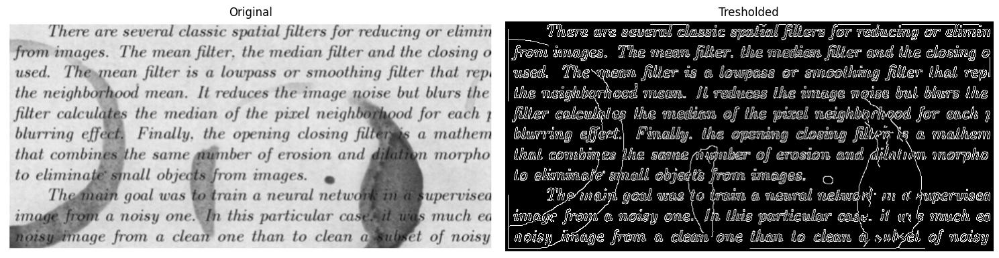

In [21]:
edges = detect_edges(img)

display_images([img, edges], ["Original", "Tresholded"])

Let's try making erotion with k3, after this edge detection, and after this dilation two times.

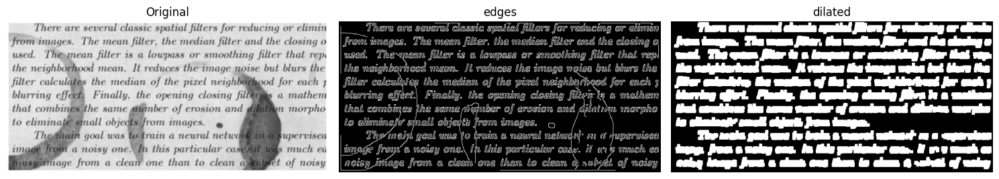

In [22]:
edges = detect_edges(img)
dilated = cv2.cvtColor(apply_morphology(edges, 'dilation', kernel_size=3), cv2.COLOR_BGR2RGB)
eroded = cv2.cvtColor(apply_morphology(dilated, 'erosion', kernel_size=5), cv2.COLOR_BGR2RGB)
dilated = cv2.cvtColor(apply_morphology(eroded, 'dilation', kernel_size=7), cv2.COLOR_BGR2RGB)


display_images([img, edges, dilated], ["Original","edges" ,"dilated"])

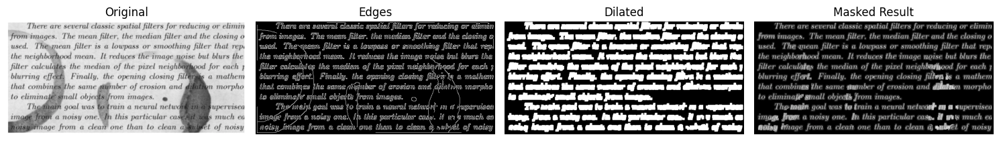

In [103]:
# Assuming img is the original image and dilated is the processed black/white image
# Convert dilated from RGB back to grayscale (since it was converted to RGB earlier)
mask = cv2.cvtColor(dilated, cv2.COLOR_RGB2GRAY)

# Ensure the mask is binary (0 or 255)
_, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

# If the original image is in BGR (OpenCV default), convert it to RGB for consistency
if len(img.shape) == 3 and img.shape[2] == 3:
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
else:
    img_rgb = img  # If img is already grayscale or in a compatible format

# Apply the mask to the original image
# Use cv2.bitwise_and to keep only the white regions from the mask
masked_image = cv2.bitwise_and(~img_rgb, ~img_rgb, mask=mask)

# Display the original, edges, dilated, and masked result
display_images([img_rgb, edges, dilated, masked_image], 
               ["Original", "Edges", "Dilated", "Masked Result"])

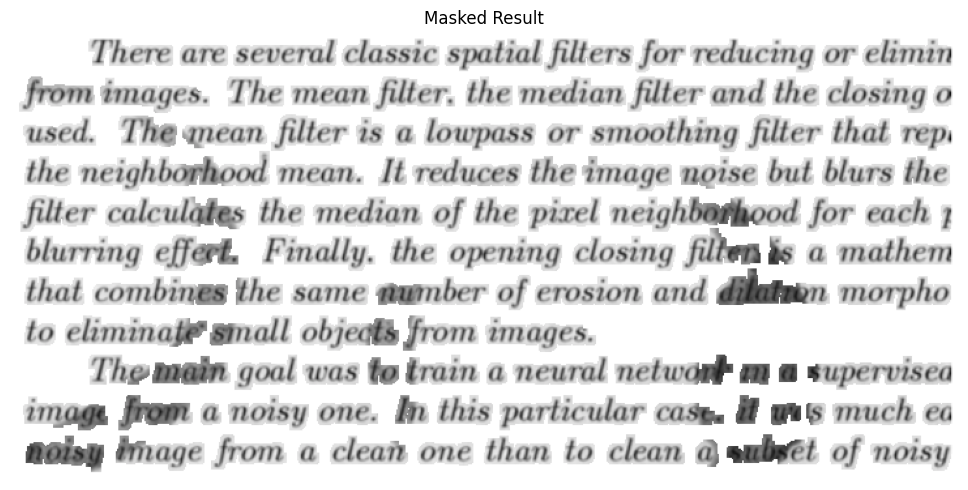

In [105]:
# Display the original, edges, dilated, and masked result
display_images([~masked_image], 
               [ "Masked Result"])

The result is relatively good. But let's try different approach. We will use the same techniques as in previous image, but now we will apply 2 thresholds.

1. On the part of the image without coffe strains -> In order to make text to be black, and background - white.
2. On the part of the image with coffe strains.

By applying separatly this will help us to keep diferentiation within the strains, and this will help to make evidentiate text better.

In [109]:
def get_from_original_image_only_text(img, text_as_white_pixels):
    # Assuming img is the original image and dilated is the processed black/white image
    # Convert dilated from RGB back to grayscale (since it was converted to RGB earlier)
    mask = cv2.cvtColor(text_as_white_pixels, cv2.COLOR_RGB2GRAY)

    # Ensure the mask is binary (0 or 255)
    _, mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)

    # If the original image is in BGR (OpenCV default), convert it to RGB for consistency
    if len(img.shape) == 3 and img.shape[2] == 3:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:
        img_rgb = img  # If img is already grayscale or in a compatible format

    # Apply the mask to the original image
    # Use cv2.bitwise_and to keep only the white regions from the mask
    masked_image = ~cv2.bitwise_and(~img_rgb, ~img_rgb, mask=mask)

    return masked_image

In [100]:
def get_strain_mask(img):
    dilated = cv2.cvtColor(apply_morphology(img, 'dilation', kernel_size=9), cv2.COLOR_BGR2RGB)
    eroded = cv2.cvtColor(apply_morphology(dilated, 'erosion', kernel_size=9), cv2.COLOR_BGR2RGB)

    strain_mask = apply_threshold(eroded, method="otsu")

    return strain_mask


In [122]:
def get_text_as_white_pixels(img):
    edges = detect_edges(img)
    dilated = cv2.cvtColor(apply_morphology(edges, 'dilation', kernel_size=7), cv2.COLOR_BGR2RGB)
    eroded = cv2.cvtColor(apply_morphology(dilated, 'erosion', kernel_size=9), cv2.COLOR_BGR2RGB)
    dilated = cv2.cvtColor(apply_morphology(eroded, 'dilation', kernel_size=9), cv2.COLOR_BGR2RGB)

    return dilated


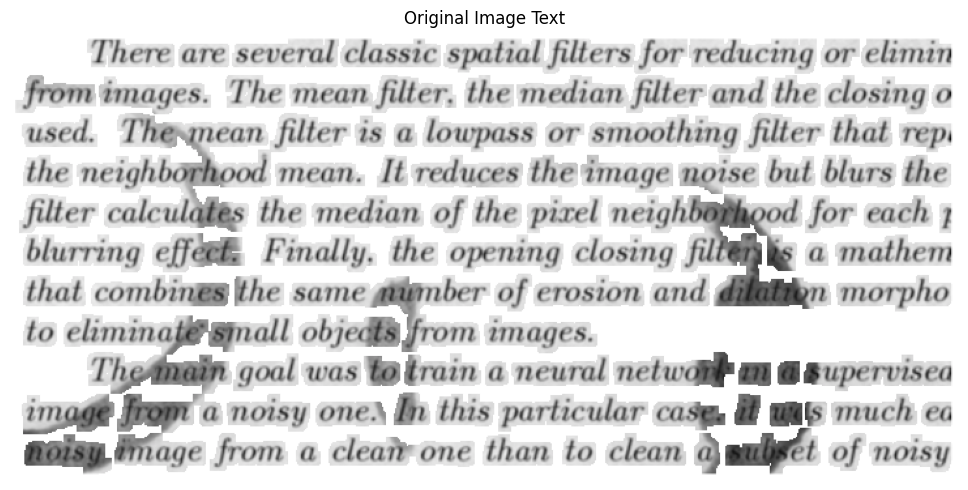

In [123]:
text_as_white_pixels = get_text_as_white_pixels(img)
original_image_text = get_from_original_image_only_text(img, text_as_white_pixels)
img_mask = get_strain_mask(img)

# Display the original, edges, dilated, and masked result
display_images([original_image_text], 
               [ "Original Image Text"])

In [111]:
image_path2 = 'low quality documents/2.png'
img2 = cv2.imread(image_path2)
# Convert BGR to RGB for display


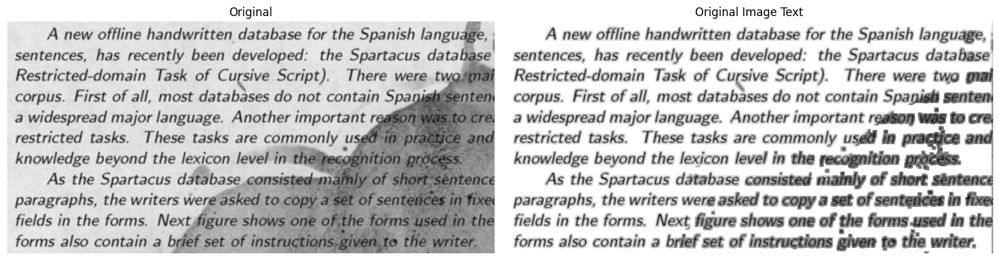

In [125]:
text_as_white_pixels = get_text_as_white_pixels(img2)
original_image_text = get_from_original_image_only_text(img2, text_as_white_pixels)
img_mask = get_strain_mask(img2)

# Display the original, edges, dilated, and masked result
display_images([img2,original_image_text], 
               ["Original" ,"Original Image Text"])

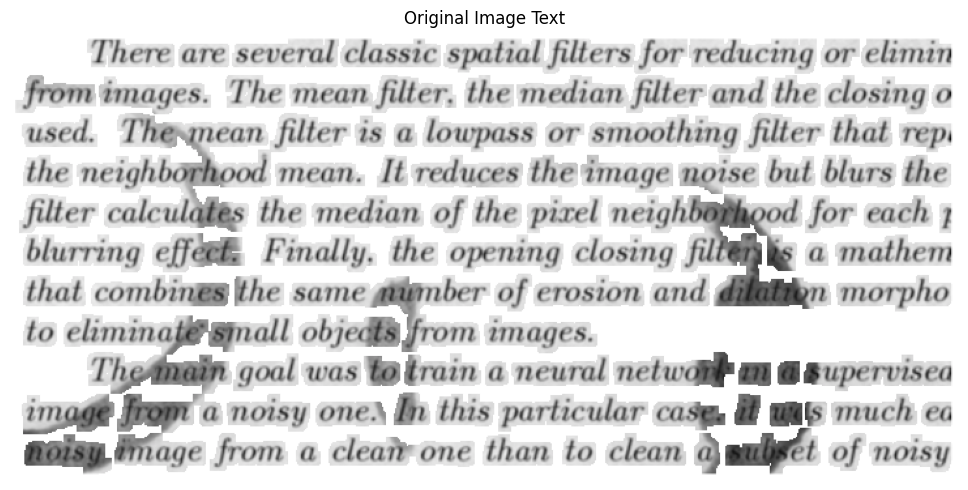

In [127]:
text_as_white_pixels = get_text_as_white_pixels(img)
original_image_text = get_from_original_image_only_text(img, text_as_white_pixels)
img_mask = get_strain_mask(img)

# Display the original, edges, dilated, and masked result
display_images([original_image_text], 
               [ "Original Image Text"])


----- Non-White Pixel Statistics -----
Number of non-white pixels: 13341
Percentage of image: 5.35%
Value range: 18 to 177
Mean value: 109.21
Median value: 110.0
Standard deviation: 33.36


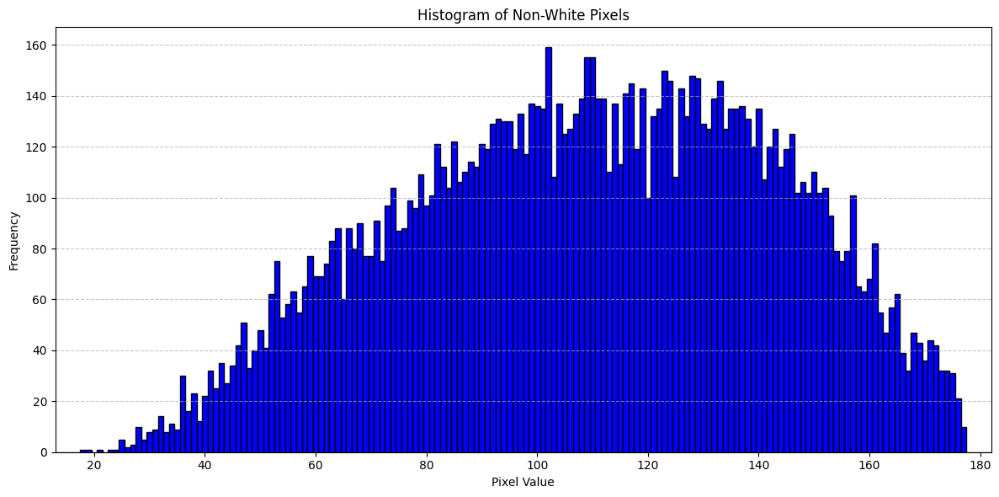


Top 10 most frequent non-white pixel values:
1. Value 102: 159 pixels (1.19% of non-white pixels)
2. Value 109: 155 pixels (1.16% of non-white pixels)
3. Value 110: 155 pixels (1.16% of non-white pixels)
4. Value 123: 150 pixels (1.12% of non-white pixels)
5. Value 128: 148 pixels (1.11% of non-white pixels)
6. Value 129: 147 pixels (1.10% of non-white pixels)
7. Value 124: 146 pixels (1.09% of non-white pixels)
8. Value 133: 146 pixels (1.09% of non-white pixels)
9. Value 117: 145 pixels (1.09% of non-white pixels)
10. Value 119: 143 pixels (1.07% of non-white pixels)

Distribution by range:
Range 0-50: 559 pixels (4.19% of non-white pixels)
Range 51-100: 4751 pixels (35.61% of non-white pixels)
Range 101-150: 6490 pixels (48.65% of non-white pixels)
Range 151-200: 1541 pixels (11.55% of non-white pixels)
Range 201-254: 0 pixels (0.00% of non-white pixels)


(array([175, 167, 152, ..., 168, 177, 175], dtype=uint8),
 array([  0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
          0,   0,   0,   0,   0,   1,   1,   0,   1,   0,   1,   1,   5,
          2,   3,  10,   5,   8,   9,  14,   8,  11,   9,  30,  16,  23,
         12,  22,  32,  25,  35,  27,  34,  42,  51,  33,  40,  48,  41,
         62,  75,  53,  58,  63,  55,  65,  77,  69,  69,  74,  83,  88,
         60,  88,  80,  90,  77,  77,  91,  75,  97, 104,  87,  88,  99,
         96, 109,  97, 101, 121, 112, 104, 122, 106, 110, 114, 112, 121,
        119, 129, 131, 130, 130, 119, 133, 117, 137, 136, 135, 159, 108,
        137, 125, 127, 133, 139, 155, 155, 139, 139, 110, 137, 113, 141,
        145, 119, 143, 100, 132, 135, 150, 146, 108, 143, 132, 148, 147,
        129, 127, 139, 146, 127, 135, 135, 136, 131, 120, 135, 107, 120,
        127, 112, 119, 125, 102, 106, 102, 110, 102, 104,  93,  79,  75,
         79, 101,  65,  63,  68,  82,  55,  47,  57,  62,  39,  32

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def analyze_non_white_pixels(image_array):
    """
    Analyze only the non-white pixels in a grayscale image and display detailed statistics
    
    Args:
        image_array: NumPy array representing the image
    """
    # Convert to grayscale if it's not already
    if len(image_array.shape) > 2:
        gray_image = cv2.cvtColor(image_array, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = image_array.copy()
    
    # Create mask for non-white pixels (anything less than 255)
    non_white_mask = gray_image < 255
    non_white_pixels = gray_image[non_white_mask]
    
    # Check if there are any non-white pixels
    if len(non_white_pixels) == 0:
        print("No non-white pixels found in the image.")
        return None, None
    
    # Get basic statistics for non-white pixels
    min_val = np.min(non_white_pixels)
    max_val = np.max(non_white_pixels)
    mean_val = np.mean(non_white_pixels)
    median_val = np.median(non_white_pixels)
    std_val = np.std(non_white_pixels)
    
    print("\n----- Non-White Pixel Statistics -----")
    print(f"Number of non-white pixels: {len(non_white_pixels)}")
    print(f"Percentage of image: {(len(non_white_pixels)/gray_image.size)*100:.2f}%")
    print(f"Value range: {min_val} to {max_val}")
    print(f"Mean value: {mean_val:.2f}")
    print(f"Median value: {median_val}")
    print(f"Standard deviation: {std_val:.2f}")
    
    # Create histogram for non-white values
    plt.figure(figsize=(12, 6))
    
    # Use bins of size 1 to see exact pixel values
    bins = range(0, 256)
    hist, bin_edges = np.histogram(non_white_pixels, bins=bins)
    
    plt.bar(bin_edges[:-1], hist, width=1, color='blue', edgecolor='black')
    plt.xlabel('Pixel Value')
    plt.ylabel('Frequency')
    plt.title('Histogram of Non-White Pixels')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Add x-axis limit to focus on the range where we have data
    plt.xlim(max(0, min_val-5), min(255, max_val+5))
    
    plt.tight_layout()
    plt.show()
    
    # Print the most common non-white pixel values
    unique_values, counts = np.unique(non_white_pixels, return_counts=True)
    value_counts = list(zip(unique_values, counts))
    value_counts.sort(key=lambda x: x[1], reverse=True)
    
    print("\nTop 10 most frequent non-white pixel values:")
    for i, (value, count) in enumerate(value_counts[:10], 1):
        percentage = (count / len(non_white_pixels)) * 100
        print(f"{i}. Value {value}: {count} pixels ({percentage:.2f}% of non-white pixels)")
    
    # Output distribution by ranges
    print("\nDistribution by range:")
    ranges = [(0, 50), (51, 100), (101, 150), (151, 200), (201, 254)]
    for start, end in ranges:
        count = np.sum((non_white_pixels >= start) & (non_white_pixels <= end))
        percentage = (count / len(non_white_pixels)) * 100
        print(f"Range {start}-{end}: {count} pixels ({percentage:.2f}% of non-white pixels)")
    
    return non_white_pixels, hist

# Example usage:
# image = your_numpy_image_array
analyze_non_white_pixels(original_image_text2)

In [42]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def normalize_text_pixels(image_array, exclude_white=True, exclude_black=True):
    """
    Normalize the non-white, non-black pixels in an image to span the full range (0-254).
    
    Args:
        image_array: NumPy array representing the image
        exclude_white: Whether to exclude white pixels (255) from normalization
        exclude_black: Whether to exclude black pixels (0) from normalization
    
    Returns:
        Normalized image as a NumPy array
    """
    # Convert to grayscale if it's not already
    if len(image_array.shape) > 2:
        gray_image = cv2.cvtColor(image_array, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = image_array.copy()
    
    # Create a copy for the result
    result = gray_image.copy()
    
    # Create mask for pixels to consider (excluding white and/or black if specified)
    mask = np.ones_like(gray_image, dtype=bool)
    if exclude_white:
        mask = mask & (gray_image < 255)
    if exclude_black:
        mask = mask & (gray_image > 0)
    
    # Find the pixels to normalize
    pixels_to_normalize = gray_image[mask]
    
    if len(pixels_to_normalize) == 0:
        print("No pixels to normalize after excluding white and black.")
        return result
    
    # Find the current range of these pixels
    current_min = np.min(pixels_to_normalize)
    current_max = np.max(pixels_to_normalize)
    current_range = current_max - current_min
    
    
    if current_range == 0:
        print("All non-white/black pixels have the same value. No normalization needed.")
        return result
    
    # Normalize the pixels to span 0-254
    # First shift the range to start at 0
    pixels_shifted = pixels_to_normalize - current_min
    # Then scale to the target range (0-254)
    target_range = 254  # From 0 to 254
    pixels_normalized = (pixels_shifted / current_range * target_range).astype(np.uint8)
    
    # Create the output image
    normalized_image = np.ones_like(gray_image) * 255  # Start with all white
    
    # For pixels that should be normalized, copy their new values
    result[mask] = pixels_normalized
    
    # Statistics on the normalization
    new_min = np.min(result[mask])
    new_max = np.max(result[mask])
    
    return result

def display_before_after_normalization(original, normalized):
    """
    Display the original and normalized images side by side with histograms
    """
    plt.figure(figsize=(16, 10))
    
    # Original image
    plt.subplot(2, 2, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')
    
    # Original histogram (excluding white)
    plt.subplot(2, 2, 2)
    mask = original < 255
    if np.any(mask):
        plt.hist(original[mask].ravel(), bins=256, range=(0, 255), color='blue', alpha=0.7)
        plt.title('Original Histogram (excluding white)')
        plt.xlim(0, 255)
    else:
        plt.text(0.5, 0.5, 'No non-white pixels', ha='center', va='center')
    
    # Normalized image
    plt.subplot(2, 2, 3)
    plt.imshow(normalized, cmap='gray')
    plt.title('Normalized Image')
    plt.axis('off')
    
    # Normalized histogram (excluding white)
    plt.subplot(2, 2, 4)
    mask = normalized < 255
    if np.any(mask):
        plt.hist(normalized[mask].ravel(), bins=256, range=(0, 255), color='green', alpha=0.7)
        plt.title('Normalized Histogram (excluding white)')
        plt.xlim(0, 255)
    else:
        plt.text(0.5, 0.5, 'No non-white pixels', ha='center', va='center')
    
    plt.tight_layout()
    plt.show()

# Example usage:
# original_image = your_numpy_image_array

Original range of non-white/black pixels: 18 to 177
Normalized range: 0 to 254


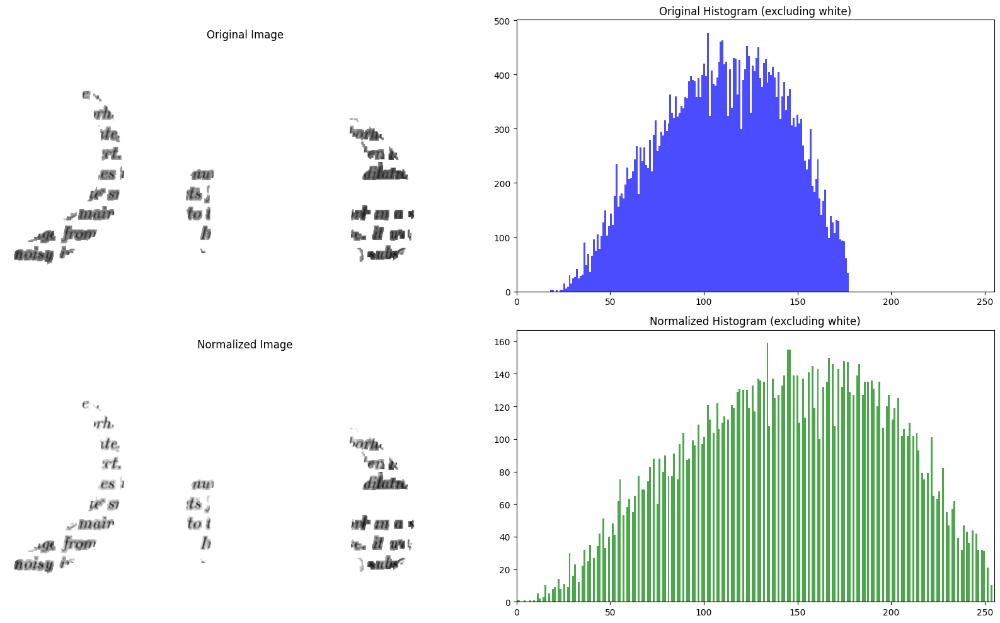

In [32]:
normalized_image = normalize_text_pixels(original_image_text2)
display_before_after_normalization(original_image_text2, normalized_image)

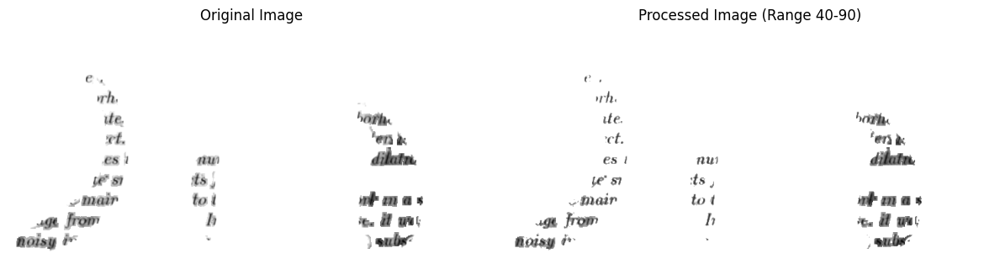

In [33]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def apply_threshold_range(image_array, lower_bound=40, upper_bound=90):
    """
    Apply a threshold to keep only pixels in the specified range.
    All pixels outside this range are set to white (255).
    
    Args:
        image_array: NumPy array representing the image
        lower_bound: Lower threshold (inclusive)
        upper_bound: Upper threshold (inclusive)
    
    Returns:
        Processed image as a NumPy array
    """
    # Convert to grayscale if it's not already
    if len(image_array.shape) > 2:
        gray_image = cv2.cvtColor(image_array, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = image_array.copy()
    
    # Create a mask for pixels in the specified range
    mask = (gray_image >= lower_bound) & (gray_image <= upper_bound)
    
    # Create output image (all white)
    result = np.ones_like(gray_image) * 255
    
    # Keep only the pixels in the specified range
    result[mask] = gray_image[mask]
    
    # Count how many pixels were kept
    pixels_kept = np.sum(mask)
    total_pixels = gray_image.size
    percentage_kept = (pixels_kept / total_pixels) * 100
    
    return result

def display_before_after(original, processed):
    """
    Display the original and processed images side by side
    """
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    plt.imshow(original, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(processed, cmap='gray')
    plt.title(f'Processed Image (Range 40-90)')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage:
# original_image = your_numpy_image_array
processed_image = apply_threshold_range(normalized_image, 0, 170)



display_before_after(normalized_image, processed_image)

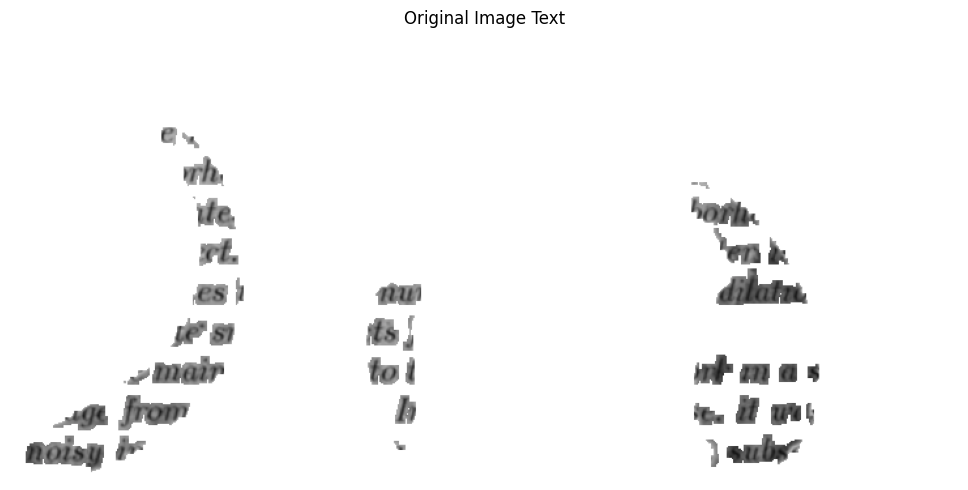

In [34]:
# Display the original, edges, dilated, and masked result
display_images([original_image_text2], 
               [ "Original Image Text"])

In [96]:
def apply_threshold_separatly(image, mask):
    if image.dtype != np.uint8:
        image = image.astype(np.uint8)
    if mask.dtype != np.uint8:
        mask = mask.astype(np.uint8)

    black_mask = (mask == 0).astype(
        np.uint8
    )  # Binary mask for black areas (1 where black, 0 elsewhere)


    image_black_areas = cv2.bitwise_and(image, image, mask=black_mask)

    normalized_image = normalize_text_pixels(image_black_areas)


    threshold_black = apply_threshold_range(normalized_image, 0, 120)


    # Step 2: Apply threshold to white mask areas (where mask == 255)

    white_mask = (mask == 255).astype(
        np.uint8
    )  # Binary mask for white areas (1 where white, 0 elsewhere)

    image_white_areas = cv2.bitwise_and(image, image, mask=white_mask)

    normalized_image = normalize_text_pixels(image_white_areas)


    threshold_white = apply_threshold_range(normalized_image, 0, 180)


    # Step 3: Combine the results using the mask

    # Where mask is black (0), use threshold_black; where mask is white (255), use threshold_white

    output = np.where(mask == 0, threshold_black, threshold_white)

    return output

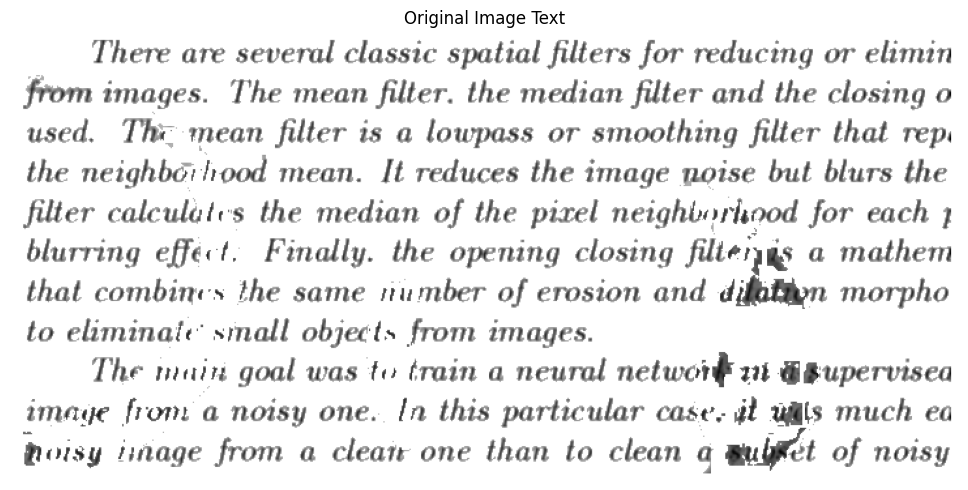

In [128]:
text_as_white_pixels = get_text_as_white_pixels(img)
original_image_text = get_from_original_image_only_text(img, text_as_white_pixels)
img_mask = get_strain_mask(img)



output = apply_threshold_separatly(original_image_text, img_mask)

# Display the original, edges, dilated, and masked result
display_images([output], 
               [ "Original Image Text"])

In [129]:
def remove_stains(img):
    text_as_white_pixels = get_text_as_white_pixels(img)
    original_image_text = get_from_original_image_only_text(img, text_as_white_pixels)
    img_mask = get_strain_mask(img)

    output = apply_threshold_separatly(original_image_text, img_mask)

    return output

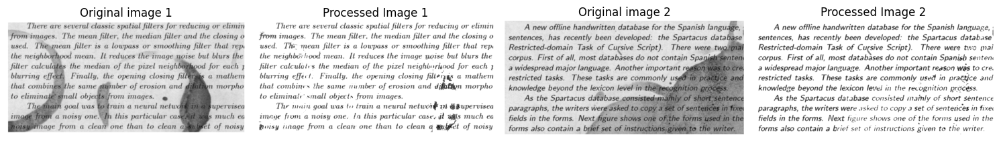

In [134]:
output1 = remove_stains(img)
output2 = remove_stains(img2)


# Display the original, edges, dilated, and masked result
display_images([img, output1, img2, output2], 
               [ "Original image 1", "Processed Image 1", "Original image 2", "Processed Image 2"])